In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
from pathlib import Path
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Background

Annually in the USA, an estimated 1.5 million vertebral compression fractures occur — the most common located in the cervical spine where only 25–33% of incident radiographically identified vertebral fractures are clinically diagnosed. Quickly detecting and determining the location of vertebral fractures is essential to prevent neurologic deterioration and paralysis after trauma.


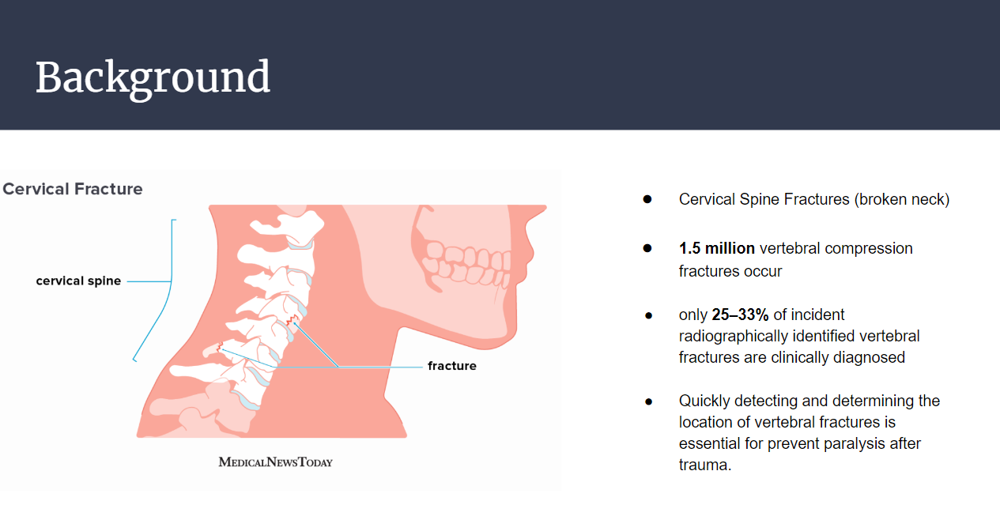

### High Level Summary of Datasets

**Train.csv**
* 2019 patients in train set (balanced at patient_overall level, imbalanced at vertebrae level: Most frequent injured bone - C7; Least frequent injured bone - C3)

**Train Image / Metadata**
* No missing data in train image
* Majority of patients have 200-400 CT scans in the train image set. Distribution right skewed. 
* Image size varies, need to resize to 512x512
* Image slice thickness varies, most common thickness is 0.625

**Bounding Box**
* 235 patients (12% of train set) have the bounding box
* Most of labelled patient have 15-25 bounding boxes
* Patients rarely have 100 bounding boxes, distribution right skewed


**Segmentations**
* 87 patients (4% of train set) have segmentation labelled
* Image has overlap of adjacent vertebrae
* Predict the rest of the image on whether they belong to C1-C7




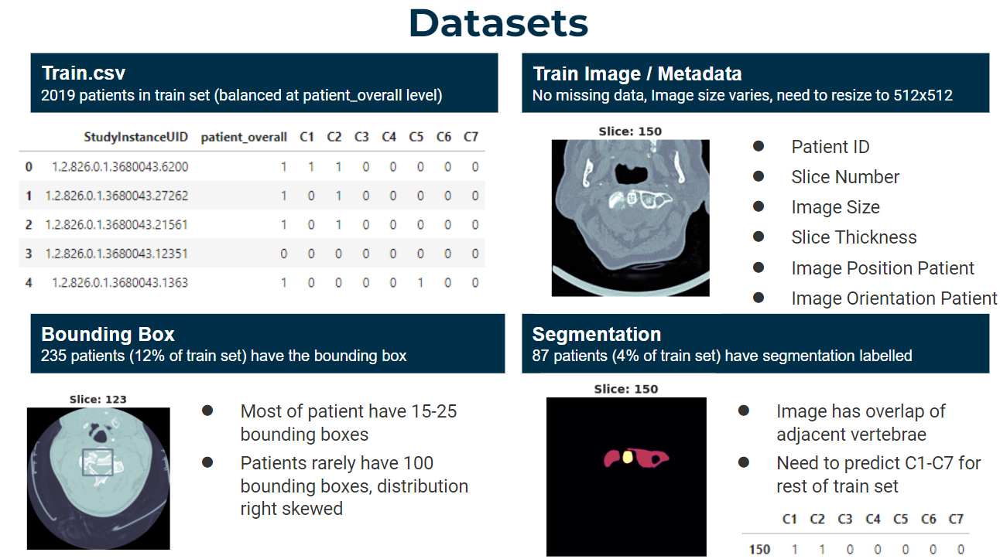

### Helper Function

In [2]:
# From https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore
def read_data():
    '''Reads in all .csv files.'''
    
    train = pd.read_csv("../input/rsna-2022-cervical-spine-fracture-detection/train.csv")
    train_bbox = pd.read_csv("../input/rsna-2022-cervical-spine-fracture-detection/train_bounding_boxes.csv")
    test = pd.read_csv("../input/rsna-2022-cervical-spine-fracture-detection/test.csv")
    ss = pd.read_csv("../input/rsna-2022-cervical-spine-fracture-detection/sample_submission.csv")
    
    return train, train_bbox, test, ss

def checkIfDuplicates(listOfElems):
    ''' Check if given list contains any duplicates '''
    if len(listOfElems) == len(set(listOfElems)):
        return False
    else:
        return True


def get_csv_info(csv, name="Default"):
    '''Prints main information for the speciffied .csv file.'''
    
    print(f"=== {name} ===")
    print(f"Shape:", csv.shape)
    print(f"Missing Values:", csv.isna().sum().sum(), "total missing datapoints.")
    print("Columns:", list(csv.columns), "\n")
    
    display_html(csv.head())
    print("\n")
    
def show_values_on_bars(axs, h_v="v", space=0.4):
    '''Plots the value at the end of the a seaborn barplot.
    axs: the ax of the plot
    h_v: weather or not the barplot is vertical/ horizontal'''
    
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, format(value, ','), ha="center") 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()
                value = int(p.get_width())
                ax.text(_x, _y, format(value, ','), ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)
        
def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    return [atoi(c) for c in re.split(r'(\d+)', text)]


paths = {
    'train': Path('../input/rsna-2022-cervical-spine-fracture-detection/train.csv'),
    'train_bbox': Path('../input/rsna-2022-cervical-spine-fracture-detection/train_bounding_boxes.csv'),
    'train_images': Path('../input/rsna-2022-cervical-spine-fracture-detection/train_images'),
    'train_nifti_segments': Path('../input/rsna-2022-cervical-spine-fracture-detection/segmentations'),
    'test_df': Path('../input/rsna-2022-cervical-spine-fracture-detection/test.csv'),
    'test_images': Path('../input/rsna-2022-cervical-spine-fracture-detection/test_images')
}

# Load Data

In [3]:
!pip install -qU "python-gdcm" pydicom pylibjpeg "opencv-python-headless"

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
easyocr 1.5.0 requires opencv-python-headless<=4.5.4.60, but you have opencv-python-headless 4.6.0.66 which is incompatible.


In [4]:
# Libraries
import os
import re
import gc
import cv2
import wandb
from PIL import Image
import random
import math
import shutil
from glob import glob
from tqdm import tqdm
from pprint import pprint
from time import time
import warnings
import itertools
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
from matplotlib import cm
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.patches import Rectangle
from IPython.display import display_html
plt.rcParams.update({'font.size': 16})

# .dcm handling
import pydicom
import nibabel as nib
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Environment check
warnings.filterwarnings("ignore")

# set seaborn theme
sns.set_theme(style="darkgrid")

In [5]:
INPUT = "../input/rsna-2022-cervical-spine-fracture-detection"

train, train_bbox, test, ss = read_data()

for cvs, name in zip([train, train_bbox, test, ss], ["Train", "Train Bbox", "Test", "Sample Submission"]):
    get_csv_info(cvs, name)

=== Train ===
Shape: (2019, 9)
Missing Values: 0 total missing datapoints.
Columns: ['StudyInstanceUID', 'patient_overall', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7'] 



,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0




=== Train Bbox ===
Shape: (7217, 6)
Missing Values: 0 total missing datapoints.
Columns: ['StudyInstanceUID', 'x', 'y', 'width', 'height', 'slice_number'] 



,StudyInstanceUID,x,y,width,height,slice_number
0,1.2.826.0.1.3680043.10051,219.27715,216.71419,17.30440,20.38517,133
1,1.2.826.0.1.3680043.10051,221.56460,216.71419,17.87844,25.24362,134
2,1.2.826.0.1.3680043.10051,216.82151,221.62546,27.00959,26.37454,135
3,1.2.826.0.1.3680043.10051,214.49455,215.48637,27.92726,37.51363,136
4,1.2.826.0.1.3680043.10051,214.00000,215.48637,27.00000,43.51363,137




=== Test ===
Shape: (3, 3)
Missing Values: 0 total missing datapoints.
Columns: ['row_id', 'StudyInstanceUID', 'prediction_type'] 



,row_id,StudyInstanceUID,prediction_type
0,1.2.826.0.1.3680043.10197_C1,1.2.826.0.1.3680043.10197,C1
1,1.2.826.0.1.3680043.10454_C1,1.2.826.0.1.3680043.10454,C1
2,1.2.826.0.1.3680043.10690_C1,1.2.826.0.1.3680043.10690,C1




=== Sample Submission ===
Shape: (3, 2)
Missing Values: 0 total missing datapoints.
Columns: ['row_id', 'fractured'] 



,row_id,fractured
0,1.2.826.0.1.3680043.10197_C1,0.5
1,1.2.826.0.1.3680043.10454_C1,0.5
2,1.2.826.0.1.3680043.10690_C1,0.5


# train.cvs

Key takeaways:
* 48% of patients in the train set have broken bones. The training data is well-balanced. 
* C7, C2 bones have most frenquent injuries. C3, C4 bones have the least frequent injuries.
* Majority (65%) of patients broke only 1 bone, and very few (3%) patients broke over 4 bones. 
* Patients, who have over 1 broken bone, usually broke the bones in the nearby area, such as broke C6, C7 or C1, C2 at the same time. 

In [6]:
train["total_fractures"] = train.iloc[:, 2:9].sum(axis=1)
train.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0,1
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0,1


Text(0.5, 1.0, 'Patient Overall Fracture Frequency')

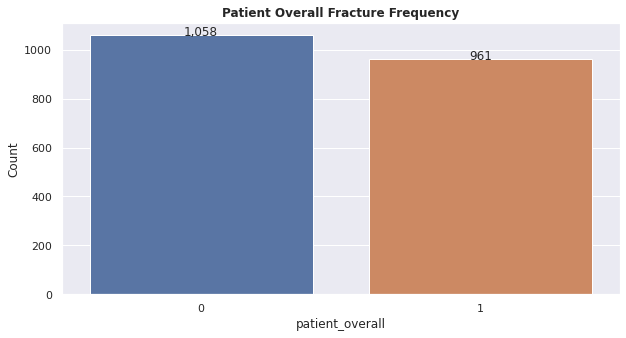

In [7]:
plt.figure(figsize=(10, 5))
ax = sns.countplot(x="patient_overall", data=train)
ax.set(ylabel="Count")
show_values_on_bars(ax, h_v="v", space = 0.4)
ax.set_title('Patient Overall Fracture Frequency', weight="bold", size=12)

Text(0.5, 1.0, 'Vertebra Fracture Frequency')

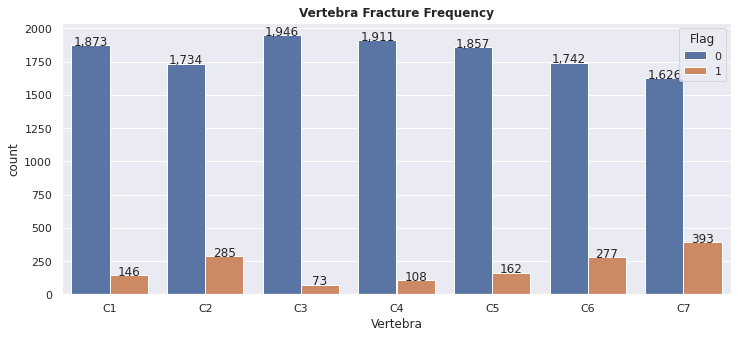

In [8]:
df = pd.melt(train, 
             id_vars=['StudyInstanceUID', 'patient_overall','total_fractures'],
             var_name="Vertebra",
             value_name="Flag")
df.head()

plt.figure(figsize=(12, 5))
ax1 = sns.countplot(x= 'Vertebra', hue = 'Flag', data = df)
show_values_on_bars(ax1, h_v="v", space = 0.4)
ax1.set_title('Vertebra Fracture Frequency', weight="bold", size=12)

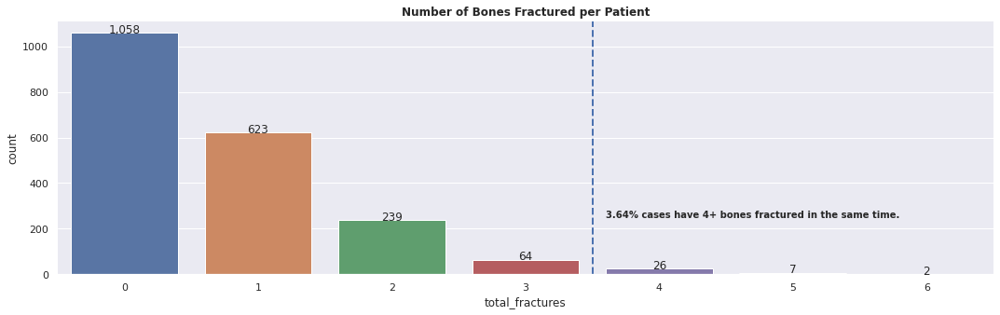

In [9]:
plt.figure(figsize=(18, 5))
ax2 = sns.countplot(data=train, x="total_fractures")
show_values_on_bars(ax2, h_v="v", space=0.4)
plt.title("Number of Bones Fractured per Patient", weight="bold", size=12)

# Line    
plt.axvline(x=3.5, linestyle = '--', lw=2)
plt.text(x=3.6, y=250, s=f"{round((26+7+2)/961*100,2)}% cases have 4+ bones fractured in the same time.",
        size=10, weight="bold")

sns.despine(right=True, top=True, left=True);

In [10]:
#commonly broken bones
common_broken_bones = df.where(df.Flag ==1).groupby('StudyInstanceUID')['Vertebra'].unique().astype(str).value_counts()
common_broken_bones[:10]

['C7']              223
['C2']              180
['C6']               82
['C6' 'C7']          77
['C1']               64
['C1' 'C2']          42
['C5' 'C6']          36
['C4']               28
['C5']               28
['C5' 'C6' 'C7']     21
Name: Vertebra, dtype: int64

# train Image / Metadata

Key takeaways:

**Patient slice counts**
* Majority of patients have 200-400 CT scans in the train set. Distribution right skewed. 

**Slice Thickness Frequency**
* Most of patients’ CT scan slice thickness is 0.62
* Many variation 

**Image Size**
* 98% of train images are 512 x 512, few of them have image sizes as 768 x 768, 512 x 519.We need to resize them before modeling. 


In [11]:
#take a look at one example

example = '../input/rsna-2022-cervical-spine-fracture-detection/train_images/1.2.826.0.1.3680043.10001/1.dcm'
dcm_example = pydicom.dcmread(example)
dcm_example

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.826.0.1.3680043.10001.1.1
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.3.0'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 1.2.826.0.1.3680043.10001.1.1
(0008, 0023) Content Date                        DA: '20220727'
(0008, 0033) Content Time                        TM: '175846.217587'
(0010, 0010) Patient's Name                      PN: '10001'
(0010, 0020) Patient ID                          LO: '10001'
(0018, 0050) Slice Thickness                     DS: '0.625'
(0020, 000d) Study Instance UID                  UI: 1.2.826.0.1

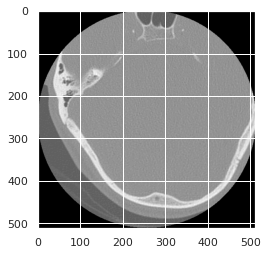

In [12]:
#display the example image above 
#reference: https://github.com/pydicom/pydicom

arr = dcm_example.pixel_array

plt.imshow(arr, cmap="gray")
plt.show()

#### Metadata:
* Rows -> the height of the CT scan/image
* Columns -> the width of the CT scan/image
* SOPInstanceUID -> Unique identifier containing the StudyInstanceUID + slice number
* ContentDate -> the date the image pixel data creation started
* SliceThickness -> gives the thickness of the imaged slice (TODO: maybe pair with Spacing Between Slices - gives the distance between two adjacent slices)
* InstanceNumber -> slice number
* ImagePositionPatient -> the x, y, and z coordinates of the upper left hand corner (center of the first voxel transmitted) of the image, in mm
* ImageOrientationPatient -> the direction cosines of the first row and the first column with respect to the patient
information from DICOM standard browser.
Reference: https://dicom.innolitics.com/ciods/rt-dose/image-plane/00200037

In [13]:
# From https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore#3.-DICOM-Metadata
def get_metadata():
    '''
    Retrieves the desired metadata from the .dcm files and saves it into dataframe.
    '''
    
    exceptions = 0
    dicts = []

    for k in tqdm(range(len(train_df))):
        if (k % 100)==0:
            print(f'Iteration: {k}')
            
        dt = train_df.iloc[k, :]

        # Get all .dcm paths for this Instance
        dcm_paths = glob(f"{base_path}/train_images/{dt.StudyInstanceUID}/*")

        for path in dcm_paths:
            try:
                # Get datasets
                dataset = get_observation_data(path)
                dicts.append(dataset)
            except Exception as e:
                exceptions += 1
                continue

    # Convert into df
    meta_train_data = pd.DataFrame(data=dicts, columns=md_example.keys())
    
    # Export information
    meta_train_data.to_csv("../meta-train/meta_train.csv", index=False)
    
    print(f"Metadata created. Number of total fails: {exceptions}.")

In [14]:
# Create and save the metadata (~ 2 hours)
# base_path = "../input/rsna-2022-cervical-spine-fracture-detection"

# get_metadata()

In [15]:
# From https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore
def get_observation_data(path):
    '''
    Get information from the .dcm files
    '''

    dataset = pydicom.read_file(path)
    
    # Dictionary to store the information from the image
    observation_data = {
        "Rows" : dataset.get("Rows"),
        "Columns" : dataset.get("Columns"),
        "SOPInstanceUID" : dataset.get("SOPInstanceUID"),
        "ContentDate" : dataset.get("ContentDate"),
        "SliceThickness" : dataset.get("SliceThickness"),
        "InstanceNumber" : dataset.get("InstanceNumber"),
        "ImagePositionPatient" : dataset.get("ImagePositionPatient"),
        "ImageOrientationPatient" : dataset.get("ImageOrientationPatient"),
    }

    # String columns
    str_columns = ["SOPInstanceUID", "ContentDate", 
                   "SliceThickness", "InstanceNumber"]
    for k in str_columns:
        observation_data[k] = str(dataset.get(k)) if k in dataset else None
    
    return observation_data

In [16]:
get_observation_data(example)

{'Rows': 512,
 'Columns': 512,
 'SOPInstanceUID': '1.2.826.0.1.3680043.10001.1.1',
 'ContentDate': '20220727',
 'SliceThickness': '0.625000',
 'InstanceNumber': '1',
 'ImagePositionPatient': [-52.308, -27.712, 7.282],
 'ImageOrientationPatient': [1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]}

In [17]:
# # Read in saved metadata
meta_train_path = '../input/meta-train/meta_train.csv'
meta_train = pd.read_csv(meta_train_path)
meta_train.head()

,Rows,Columns,SOPInstanceUID,ContentDate,SliceThickness,InstanceNumber,ImagePositionPatient,ImageOrientationPatient
0,512,512,1.2.826.0.1.3680043.6200.1.240,20220727,1.0,240,"[-118.530, -103.5302, 143.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ..."
1,512,512,1.2.826.0.1.3680043.6200.1.12,20220727,1.0,12,"[-118.530, -103.5302, 325.70]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ..."
2,512,512,1.2.826.0.1.3680043.6200.1.210,20220727,1.0,210,"[-118.530, -103.5302, 167.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ..."
3,512,512,1.2.826.0.1.3680043.6200.1.120,20220727,1.0,120,"[-118.530, -103.5302, 239.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ..."
4,512,512,1.2.826.0.1.3680043.6200.1.208,20220727,1.0,208,"[-118.530, -103.5302, 168.90]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ..."


In [18]:
# check if the patients count match 
# 2019 match with total patients number in train
meta_train['StudyInstanceUID'] = meta_train['SOPInstanceUID'].apply(lambda x: ".".join(x.split(".")[:-2]))
print("meta train shape:", meta_train.shape)
print("number of patients:", meta_train['StudyInstanceUID'].nunique())

meta train shape: (711601, 9)
number of patients: 2019


#### Image Size

  image_size  counts    percent
0    512x512  710574  99.855678
1    768x768     782   0.109893
2    512x519     245   0.034429


Text(0.5, 1.0, 'Image Size Frequency')

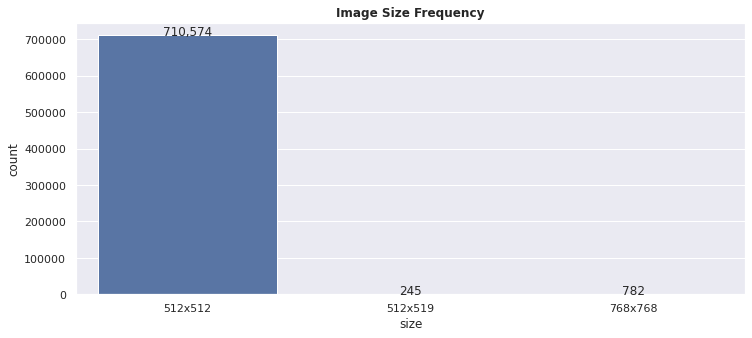

In [19]:
#distribution of image size (Rows x Columns)
meta_train['size'] = meta_train['Rows'].astype(str) + "x" + meta_train['Columns'].astype(str)
size_data = meta_train['size'].value_counts().reset_index()
size_data.columns = ['image_size', 'counts']
size_data['percent'] = (size_data['counts'] / size_data['counts'].sum()) * 100
print(size_data)
# we should make 768 x 768 and 512 x 519 as 512 x 512 to be consistent

plt.figure(figsize=(12, 5))
ax3= sns.countplot(x='size', data = meta_train)
show_values_on_bars(ax3)
ax3.set_title('Image Size Frequency', weight="bold", size=12)

In [20]:
meta_train[meta_train['Rows']==768].head()

,Rows,Columns,SOPInstanceUID,ContentDate,SliceThickness,InstanceNumber,ImagePositionPatient,ImageOrientationPatient,StudyInstanceUID,size
97418,768,768,1.2.826.0.1.3680043.22678.1.377,20220727,1.0,377,"[-131.5, -1.5, 207]","[1, 0, 0, 0, 1, 0]",1.2.826.0.1.3680043.22678,768x768
97419,768,768,1.2.826.0.1.3680043.22678.1.257,20220727,1.0,257,"[-131.5, -1.5, 147]","[1, 0, 0, 0, 1, 0]",1.2.826.0.1.3680043.22678,768x768
97420,768,768,1.2.826.0.1.3680043.22678.1.240,20220727,1.0,240,"[-131.5, -1.5, 138.5]","[1, 0, 0, 0, 1, 0]",1.2.826.0.1.3680043.22678,768x768
97421,768,768,1.2.826.0.1.3680043.22678.1.317,20220727,1.0,317,"[-131.5, -1.5, 177]","[1, 0, 0, 0, 1, 0]",1.2.826.0.1.3680043.22678,768x768
97422,768,768,1.2.826.0.1.3680043.22678.1.12,20220727,1.0,12,"[-131.5, -1.5, 24.5]","[1, 0, 0, 0, 1, 0]",1.2.826.0.1.3680043.22678,768x768


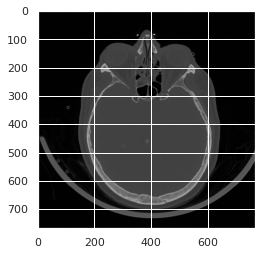

In [21]:
irr_image_path = '../input/rsna-2022-cervical-spine-fracture-detection/train_images/1.2.826.0.1.3680043.22678/377.dcm'
dcm_example2 = pydicom.dcmread(irr_image_path)
arr = dcm_example2.pixel_array

plt.imshow(arr, cmap="gray")
plt.show()

We can safely resize them as 512 x 512 image.

#### Content Date
Same date as the competition start date

In [22]:
meta_train['ContentDate'].value_counts()

20220727    711601
Name: ContentDate, dtype: int64

#### Slice Thickness

In [23]:
meta_train['SliceThickness'].value_counts()

0.625000    362206
1.000000    165994
0.500000     94721
0.600000     72303
0.900000     10718
0.670000      2734
0.800000      1803
0.750000       661
0.600000       309
0.664062        83
0.488281        69
Name: SliceThickness, dtype: int64

Text(0.5, 1.0, 'Slice Thickness Frequency')

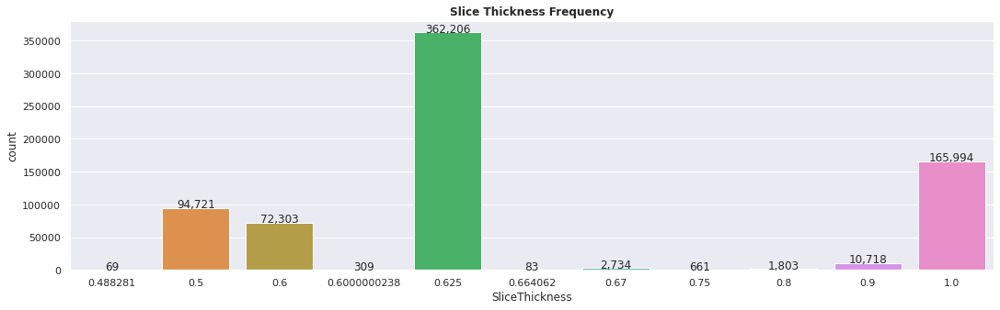

In [24]:
plt.figure(figsize=(18, 5))
ax4= sns.countplot(x='SliceThickness', data = meta_train)
show_values_on_bars(ax4)
ax4.set_title('Slice Thickness Frequency', weight="bold", size=12)

#### Number of slice per patient

In [25]:
meta_train.head()

,Rows,Columns,SOPInstanceUID,ContentDate,SliceThickness,InstanceNumber,ImagePositionPatient,ImageOrientationPatient,StudyInstanceUID,size
0,512,512,1.2.826.0.1.3680043.6200.1.240,20220727,1.0,240,"[-118.530, -103.5302, 143.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ...",1.2.826.0.1.3680043.6200,512x512
1,512,512,1.2.826.0.1.3680043.6200.1.12,20220727,1.0,12,"[-118.530, -103.5302, 325.70]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ...",1.2.826.0.1.3680043.6200,512x512
2,512,512,1.2.826.0.1.3680043.6200.1.210,20220727,1.0,210,"[-118.530, -103.5302, 167.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ...",1.2.826.0.1.3680043.6200,512x512
3,512,512,1.2.826.0.1.3680043.6200.1.120,20220727,1.0,120,"[-118.530, -103.5302, 239.30]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ...",1.2.826.0.1.3680043.6200,512x512
4,512,512,1.2.826.0.1.3680043.6200.1.208,20220727,1.0,208,"[-118.530, -103.5302, 168.90]","[1.00000, 0.00000, 0.00000, 0.00000, 1.00000, ...",1.2.826.0.1.3680043.6200,512x512


Text(0.5, 1.0, 'Patient Slice Count')

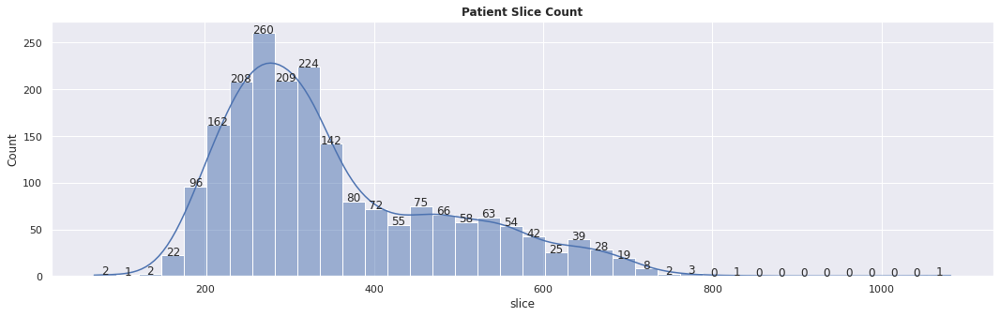

In [26]:
patient_slice = meta_train['StudyInstanceUID'].value_counts().reset_index()
patient_slice.columns = ['patientid','slice']

plt.figure(figsize=(18, 5))
ax4= sns.histplot(x='slice', data = patient_slice, kde = True)
show_values_on_bars(ax4)
ax4.set_title('Patient Slice Count', weight="bold", size=12)

# Segmentations

Key takeaway:
* segmentations include the color coding for the bones.
* Image has overlap of adjacent vertebrae
* Need to predict C1-C7 for rest of train set


In [27]:
base_path = "../input/rsna-2022-cervical-spine-fracture-detection"
patient_id = '1.2.826.0.1.3680043.10633'
dcm_paths = glob(f"{base_path}/train_images/{patient_id}/*")

# Number of cases with masks
seg_paths = glob(f"{base_path}/segmentations/*")
print(f'Number of cases with segmentations: {len(seg_paths)}, ({np.round(100*len(seg_paths)/len(train),1)}%)')

Number of cases with segmentations: 87, (4.3%)


In [28]:
# look at the same example
ex_path2 = f"../input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.10633.nii"
nii_example = nib.load(ex_path2)

# Convert to numpy array
seg = nii_example.get_fdata()
seg.shape

(512, 512, 429)

In [29]:
patient_slice[patient_slice.patientid == '1.2.826.0.1.3680043.10633']

,patientid,slice
504,1.2.826.0.1.3680043.10633,429


Segmentation shape represents (row, height, slice), each slice has a numpy array. According to this [discussion post](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/340612), we need to transform the array as 
> segmentations = nib.load(f"segmentations/1.2.826.0.1.3680043.10921.nii").get_fdata()[:, ::-1, ::-1].transpose(2, 1, 0)

In [30]:
#transform segmentation
seg_trans = seg[:, ::-1, ::-1].transpose(2, 1, 0)
seg_trans.shape

(429, 512, 512)

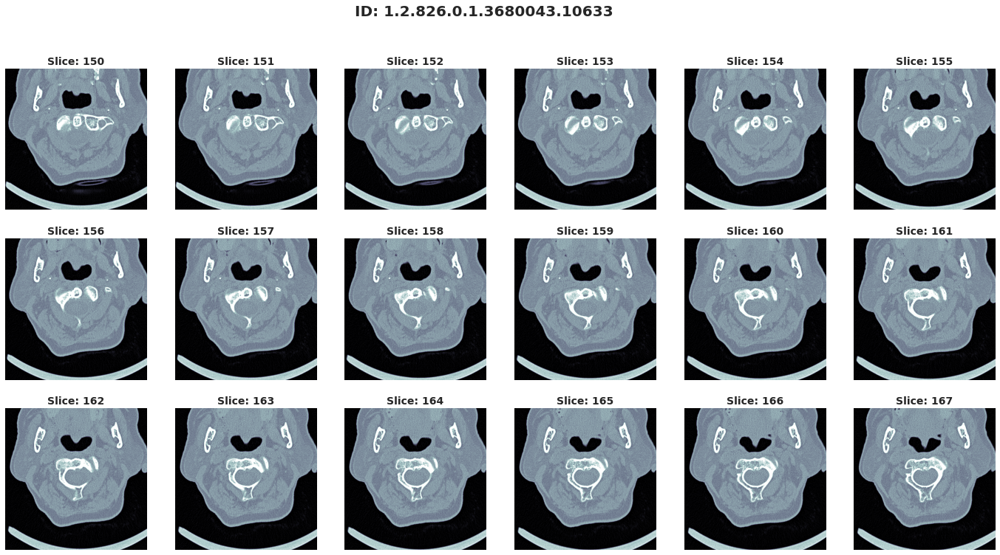

In [31]:
#code from https://www.kaggle.com/code/samuelcortinhas/rsna-fracture-detection-in-depth-eda#4.-Train-images
#visualize the original image first 

dcm_paths.sort(key=natural_keys)

# Get images
files = [pydicom.dcmread(path) for path in dcm_paths]
images = [apply_voi_lut(file.pixel_array, file) for file in files]

# Plot images
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(24,12))
fig.suptitle(f'ID: {patient_id}', weight="bold", size=20)

start = 150
for i in range(start,start+18):
    img = images[i]
    file = files[i]
    slice_no = i
    # Plot the image
    x = (i-start) // 6
    y = (i-start) % 6

    axes[x, y].imshow(img, cmap="bone")
    axes[x, y].set_title(f"Slice: {slice_no}", fontsize=14, weight='bold')
    axes[x, y].axis('off')

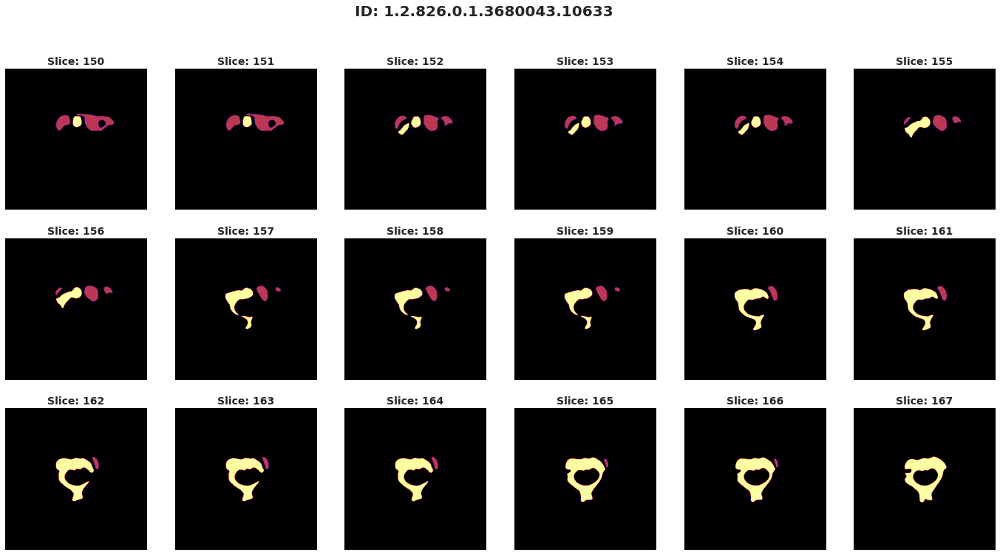

In [32]:
#visualize the corresponding segmentation images

fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(24,12))
fig.suptitle(f'ID: {patient_id}', weight="bold", size=20)

for i in range(start,start+18):
    mask = seg_trans[i]
    slice_no = i

    # Plot the image
    x = (i-start) // 6
    y = (i-start) % 6

    axes[x, y].imshow(mask, cmap='inferno')
    axes[x, y].set_title(f"Slice: {slice_no}", fontsize=14, weight='bold')
    axes[x, y].axis('off')

In [33]:
print("Some images have overlap of adjacent vertebrae, such as slice 150 bones are labelled as C1 & C2, in dataset as", np.unique(seg_trans[150]))

Some images have overlap of adjacent vertebrae, such as slice 150 bones are labelled as C1 & C2, in dataset as [0. 1. 2.]


# Bounding Box

Key takeaway:
* 235 patients (12% of train set) have the bounding box
* Most of patient have 15-25 bounding boxes
* Patients rarely have 100 bounding boxes, distribution right skewed



In [34]:
train_bbox.head()

,StudyInstanceUID,x,y,width,height,slice_number
0,1.2.826.0.1.3680043.10051,219.27715,216.71419,17.30440,20.38517,133
1,1.2.826.0.1.3680043.10051,221.56460,216.71419,17.87844,25.24362,134
2,1.2.826.0.1.3680043.10051,216.82151,221.62546,27.00959,26.37454,135
3,1.2.826.0.1.3680043.10051,214.49455,215.48637,27.92726,37.51363,136
4,1.2.826.0.1.3680043.10051,214.00000,215.48637,27.00000,43.51363,137


In [35]:
print('Only', train_bbox['StudyInstanceUID'].nunique(), 'patients have the bounding box in the train dataset.')
print('It takes about', "{0:.0%}".format(train_bbox['StudyInstanceUID'].nunique()/len(train)), 'of whole train dataset')

Only 235 patients have the bounding box in the train dataset.
It takes about 12% of whole train dataset


Text(0.5, 1.0, 'Patient Bounding Box Count')

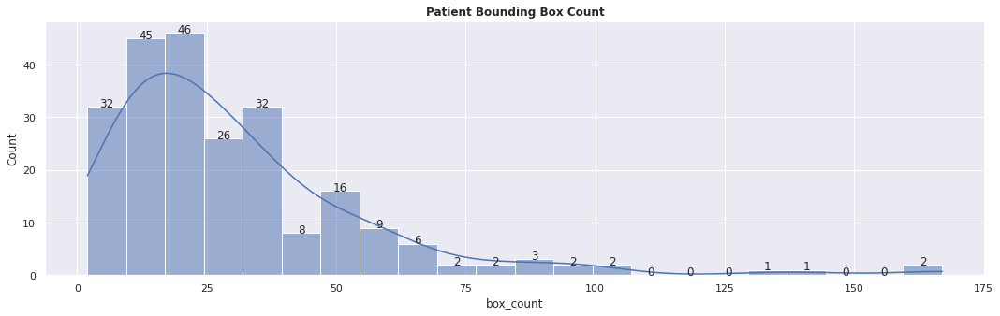

In [36]:
bbox_count = train_bbox['StudyInstanceUID'].value_counts().reset_index()
bbox_count.columns = ['patient_id','box_count']

plt.figure(figsize=(18, 5))
ax4= sns.histplot(bbox_count.box_count, kde = True)
show_values_on_bars(ax4)
ax4.set_title('Patient Bounding Box Count', weight="bold", size=12)

In [37]:
# From https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore#4.-Bounding-Boxes
def show_dcm_bboxes(studyInstanceUID, rows, cols):
    
    # Set defaults
    BASE_PATH = "../input/rsna-2022-cervical-spine-fracture-detection/train_images"
    N = rows*cols
    
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(24,15))

    # Get dataframe & .dcm paths
    bbox_df = train_bbox[train_bbox["StudyInstanceUID"]==studyInstanceUID].reset_index(drop=True).head(N)
    png_paths = [f"{BASE_PATH}/{studyInstanceUID}/{slice_no}.dcm" 
                 for slice_no in bbox_df["slice_number"]]

    for path, k in zip(png_paths, range(N)):
        dataset = pydicom.dcmread(path)
        img = apply_voi_lut(dataset.pixel_array, dataset)
        slice_no = png_paths[k].split("/")[-1].split(".")[0]

        # BBoxes
        bbox_list = (bbox_df.loc[k, "x1"], bbox_df.loc[k, "y1"],
                     bbox_df.loc[k, "x2"], bbox_df.loc[k, "y2"])
        x1, y1, x2, y2 = [ int(x) for x in bbox_list ]

        # Plot the image
        x_plot = k // cols
        y_plot = k % cols
        
        cv2.rectangle(img, (x1, y1), (x2, y2), (226, 56, 54), 5)
        axes[x_plot, y_plot].imshow(img, cmap="bone")
        axes[x_plot, y_plot].set_title(f"Slice: {slice_no}", 
                                       fontsize=14, weight='bold')
        axes[x_plot, y_plot].axis('off');

In [38]:
# Compute x2 and y2
train_bbox["x2"] = train_bbox["x"] + train_bbox["width"]
train_bbox["y2"] = train_bbox["y"] + train_bbox["height"]

# Rename columns
train_bbox.rename(columns={"x": "x1", "y": "y1"}, inplace=True)

# Change to int
train_bbox["x1"] = train_bbox["x1"].apply(lambda x: int(x))
train_bbox["x2"] = train_bbox["x2"].apply(lambda x: int(x))
train_bbox["y1"] = train_bbox["y1"].apply(lambda x: int(x))
train_bbox["y2"] = train_bbox["y2"].apply(lambda x: int(x))

train_bbox.head(3)

,StudyInstanceUID,x1,y1,width,height,slice_number,x2,y2
0,1.2.826.0.1.3680043.10051,219,216,17.30440,20.38517,133,236,237
1,1.2.826.0.1.3680043.10051,221,216,17.87844,25.24362,134,239,241
2,1.2.826.0.1.3680043.10051,216,221,27.00959,26.37454,135,243,248


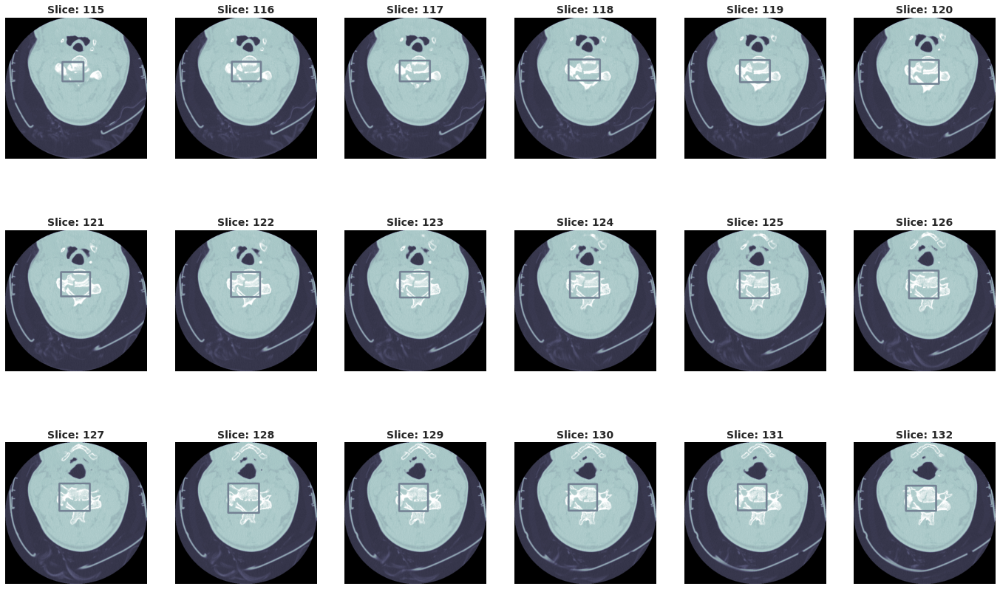

In [39]:
show_dcm_bboxes('1.2.826.0.1.3680043.25651', rows = 3, cols = 6)

# Sagittal View

In [40]:
def get_dcm_images(path):
    paths = list(path.glob('*'))
    paths.sort(key=lambda x:int(x.stem)) # sort based on slice index which is the filename: index.dcm
    data = [pydicom.dcmread(f) for f in paths]
    images = [apply_voi_lut(dcm.pixel_array, dcm) for dcm in data]
    return images

In [41]:
# some patients have reverse order for the CT scan, so have a function to check
def check_reverse_required(path):
    paths = list(path.glob('*'))
    paths.sort(key=lambda x:int(x.stem))
    z_first = pydicom.dcmread(paths[0]).get("ImagePositionPatient")[-1]
    z_last = pydicom.dcmread(paths[-1]).get("ImagePositionPatient")[-1]
    if z_last < z_first:
        return False
    return True

StudyInstanceUID                            1.2.826.0.1.3680043.25704
patient_overall                                                     0
C1                                                                  0
C2                                                                  0
C3                                                                  0
C4                                                                  0
C5                                                                  0
C6                                                                  0
C7                                                                  0
total_fractures                                                     0
segment_path        ../input/rsna-2022-cervical-spine-fracture-det...
reverse_required                                                False
Name: 41, dtype: object


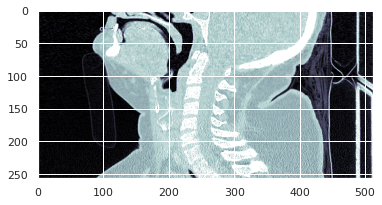

In [42]:
train['segment_path'] = train['StudyInstanceUID'].map(lambda x: paths['train_images']/x)
train['reverse_required'] = train['segment_path'].map(check_reverse_required)
print(train.loc[41,:])

dcm_images = get_dcm_images(train['segment_path'][41]) # 0 fractures
dcm_np = np.array(dcm_images)
if train['reverse_required'][41] == True:
    dcm_np = dcm_np[::-1]
sagittal_view = dcm_np[:,:,256]
plt.imshow(sagittal_view, cmap='bone')

In [43]:
# !mkdir sagittal_views

# sagittal_path = Path('./sagittal_views')
# for uid, path, rev in tqdm(train_df.loc[:,['StudyInstanceUID','segment_path','reverse_required']].values):
#     dcm_images = get_dcm_images(path)
#     dcm_np = np.array(dcm_images)
#     if rev == True:
#         dcm_np = dcm_np[::-1]
#     sagittal_view = dcm_np[:,:,256]
#     plt.imsave(sagittal_path/(uid+'.png'),sagittal_view,cmap='bone')

In [44]:
# zip the images and download it from kaggle/working
#!zip -r all_sagittal_views.zip ./sagittal_views

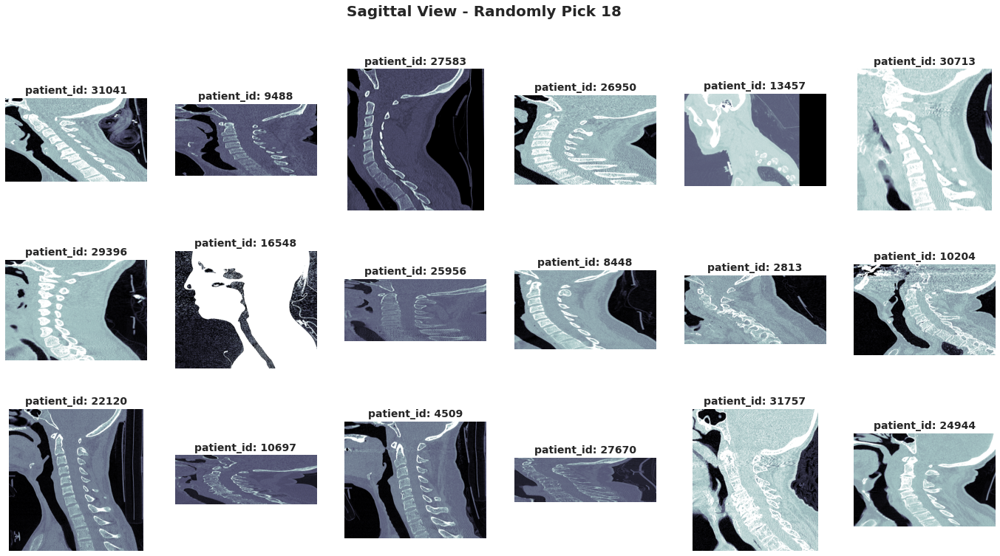

In [45]:
#visualize the sagittal vies

# load images from input 
sagittal_images = '../input/sagittal-view/saggital_views/*.png'
random_images = random.choices([image for image in glob(sagittal_images)], k =18)

sagittal_patient_id = []
for i in random_images:
    sagittal_patient_id.append(i.split(".")[-2])

# Get images
images = [mpimg.imread(image) for image in random_images]

# Plot images
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(24,12))
fig.suptitle(f'Sagittal View - Randomly Pick 18', weight="bold", size=20)

start = 0
for i in range(start,start+18):
    img = images[i]
#     file = files[i]
    patient_id = sagittal_patient_id[i]
    # Plot the image
    x = (i-start) // 6
    y = (i-start) % 6

    axes[x, y].imshow(img, cmap="bone")
    axes[x, y].set_title(f"patient_id: {patient_id}", fontsize=14, weight='bold')
    axes[x, y].axis('off')

# Animation

In [46]:
def add_nii_segment_path(uid):
    base_path = paths['train_nifti_segments']
    # path if exists else None
    path = base_path/(uid+'.nii')
    if path.exists():
        return path
    return None

train['nii_segments_path'] = train['StudyInstanceUID'].map(add_nii_segment_path)

In [47]:
def get_nii_segments(path):
    f = nib.load(path)
    segmentations = f.get_fdata()[:, ::-1, ::-1].transpose(2, 1, 0)
    return segmentations

In [48]:
sample_index = train.iloc[99,:]
dcm_images = get_dcm_images(sample_index['segment_path'])
if sample_index['reverse_required'] == True:
    dcm_images.sort(reverse=True)
segments = get_nii_segments(sample_index['nii_segments_path'])

In [49]:
# From https://www.kaggle.com/code/shreydan/understanding-the-dataset-eda-animation#Animation
from matplotlib import animation, rc
rc('animation', html='jshtml')

fig, [ax1,ax2] = plt.subplots(1,2)
ax1.axis('off')
ax2.axis('off')
images = []
for i in tqdm(range(len(dcm_images))):
    im1 = ax1.imshow(dcm_images[i], animated=True, cmap='bone')
    im2 = ax2.imshow(segments[i,:,:], animated=True, cmap='bone')
    if i==0:
        ax1.imshow(dcm_images[i], cmap='bone')
        ax2.imshow(segments[i,:,:], cmap='bone')
    images.append([im1,im2])
        

ani = animation.ArtistAnimation(fig, images, interval=50, blit=True,
                                repeat_delay=1000)
plt.close()
ani

100%|██████████| 271/271 [00:01<00:00, 191.13it/s]


## References:

* [RSNA Fracture Detection: DICOM & Images Explore](https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore)
* [RSNA Fracture Detection - in-depth EDA](https://www.kaggle.com/code/samuelcortinhas/rsna-fracture-detection-in-depth-eda)
* [Explaining Data and Submission in detail](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/340612)
* [RSNA Cervical Spine Fracture AI Challenge (2022)](https://www.rsna.org/education/ai-resources-and-training/ai-image-challenge/cervical-spine-fractures-ai-detection-challenge-2022)
* [Understanding the Dataset | EDA | Animation](https://www.kaggle.com/code/shreydan/understanding-the-dataset-eda-animation#Animation)